# Setting up the GPU devices

In [1]:
import os
!echo "CUDA Path: $CUDA_HOME"

CUDA Path: /software/spackages_v0_21_prod/apps/linux-ubuntu22.04-skylake_avx512/gcc-13.2.0/cuda-11.8.0-qidg7wz7xwmr3ffczq5hmfxc7vom6zhc


In [2]:
cuda_path = "/software/spackages_v0_21_prod/apps/linux-ubuntu22.04-skylake_avx512/gcc-13.2.0/cuda-11.8.0-qidg7wz7xwmr3ffczq5hmfxc7vom6zhc"
os.environ['CUDA_HOME'] = cuda_path
os.environ['CUDA_ROOT'] = cuda_path
os.environ['CUDA_PATH'] = cuda_path
os.environ['LD_LIBRARY_PATH'] = f"{cuda_path}/lib64:" + os.environ.get('LD_LIBRARY_PATH', '')
os.environ['XLA_FLAGS'] = f'--xla_gpu_cuda_data_dir={cuda_path}'

#Verify CUDA installation (using Python, not shell variables)
print("Checking CUDA files:")
# Use Python to check the directory
import os
libdevice_path = os.path.join(cuda_path, "nvvm", "libdevice")
if os.path.exists(libdevice_path):
    print(f"Found libdevice directory: {libdevice_path}")
    print("Contents:", os.listdir(libdevice_path))
else:
    print(f"ERROR: Directory not found: {libdevice_path}")
    print("Try finding libdevice with:")
    print(f"!find {cuda_path} -name 'libdevice.10.bc' 2>/dev/null")

# Cell 3: Direct shell command (no Python variables)
print("\nDirect shell check:")
!ls /software/spackages_v0_21_prod/apps/linux-ubuntu22.04-skylake_avx512/gcc-13.2.0/cuda-11.8.0-qidg7wz7xwmr3ffczq5hmfxc7vom6zhc

Checking CUDA files:
Found libdevice directory: /software/spackages_v0_21_prod/apps/linux-ubuntu22.04-skylake_avx512/gcc-13.2.0/cuda-11.8.0-qidg7wz7xwmr3ffczq5hmfxc7vom6zhc/nvvm/libdevice
Contents: ['libdevice.10.bc']

Direct shell check:
bin		   gds	     nsight-compute-2022.3.0  pkgconfig  tools
compute-sanitizer  gds-11.8  nsightee_plugins	      README	 version.json
DOCS		   include   nsight-systems-2022.4.2  share
EULA.txt	   lib64     nvml		      src
extras		   libnvvp   nvvm		      targets


In [3]:
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
os.environ['TF_GPU_THREAD_MODE'] = 'gpu_private'

print(f"🔧 CUDA Configuration:")
print(f"   CUDA_HOME: {os.environ.get('CUDA_HOME')}")
print(f"   XLA_FLAGS: {os.environ.get('XLA_FLAGS')}")

libdevice_path = os.path.join(cuda_path, "nvvm", "libdevice", "libdevice.10.bc")
if os.path.exists(libdevice_path):
    print(f"   ✅ Found libdevice: {libdevice_path}")
else:
    print(f"   ❌ ERROR: libdevice not found at {libdevice_path}")

🔧 CUDA Configuration:
   CUDA_HOME: /software/spackages_v0_21_prod/apps/linux-ubuntu22.04-skylake_avx512/gcc-13.2.0/cuda-11.8.0-qidg7wz7xwmr3ffczq5hmfxc7vom6zhc
   XLA_FLAGS: --xla_gpu_cuda_data_dir=/software/spackages_v0_21_prod/apps/linux-ubuntu22.04-skylake_avx512/gcc-13.2.0/cuda-11.8.0-qidg7wz7xwmr3ffczq5hmfxc7vom6zhc
   ✅ Found libdevice: /software/spackages_v0_21_prod/apps/linux-ubuntu22.04-skylake_avx512/gcc-13.2.0/cuda-11.8.0-qidg7wz7xwmr3ffczq5hmfxc7vom6zhc/nvvm/libdevice/libdevice.10.bc


## Importing essential packages

In [4]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import time
import numpy as np
import matplotlib
import random
matplotlib.rcParams["image.interpolation"] = 'none'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, normalize

from stardist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available
from stardist.matching import matching, matching_dataset
from stardist.models import Config2D, StarDist2D, StarDistData2D

np.random.seed(42)
lbl_cmap = random_label_cmap()

bioimageio_utils.py (2): pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
2025-07-13 09:30:13.450978: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-07-13 09:30:13.451068: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-07-13 09:30:13.451195: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-13 09:30:13.640477: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is o

## Preparing the Data to train the model

In [5]:
# Load full multi-frame images and labels
image_path = '../Image_Data/old/Top_30_Microns.tif'
label_path2 =  '../Image_Data/old/LblImg_Top_30_Microns.tif' #better annotation

image_stack = imread(image_path)  # Shape: (31, 2048, 2048)
label_stack2 = imread(label_path2)
label_stack2 = np.round(label_stack2).astype(int)

In [6]:
print(f"Shape of the image stack: {image_stack.shape}")  # (z, y, x)
print(f"Shape of the label stack: {label_stack2.shape}")  # (z, y, x)

Shape of the image stack: (31, 2048, 2048)
Shape of the label stack: (31, 2048, 2048)


In [8]:
print(f"image dtype: {image_stack.dtype}") 
print(f"label_stack dtype: {label_stack2.dtype}") 

image dtype: uint16
label_stack dtype: int64


## NOTE:
30 frames are not enough to train a model. Hence, as an alternative to increase the sample size, each frame in the image and label stack is cropped to create more frames to train the model.

In [9]:
def get_crop_positions(image_size, patch_size):
    """
    Generate crop positions for given image size and patch size.

    Parameters:
    - image_size (int): Size of the square image (e.g., 2048 for a 2048x2048 image).
    - patch_size (int): Size of the square patch (e.g., 512 for 512x512 patches).

    Returns:
    - List of (x, y) tuples representing top-left coordinates of the patches.
    """
    positions = [(x, y) for x in range(0, image_size, patch_size) 
                         for y in range(0, image_size, patch_size)]
    return positions


In [10]:
# Define cropping parameters
image_size = image_stack.shape[1]
crop_size = 512  # Cropped sections will be 512x512
num_crops_per_frame = 16  # Number of sections per frame

# Storage for cropped images and labels
X = []
Y2 = []

In [11]:
# Crop sections from each frame
for i in range(image_stack.shape[0]):  # Loop over 31 frames
    img = image_stack[i]
    lbl2 = label_stack2[i]
    
    # Choose crop positions (modify for random cropping if needed
    crop_positions = get_crop_positions(image_size, crop_size)
    
    for (x, y) in crop_positions[:num_crops_per_frame]:  # Select required crops
        X.append(img[x:x+crop_size, y:y+crop_size])
        Y2.append(lbl2[x:x+crop_size, y:y+crop_size])


In [12]:
# Convert lists to NumPy arrays
X = np.array(X)
Y2 = np.array(Y2)

In [13]:
len(X)

496

In [14]:
# Normalize images
axis_norm = (0, 1)   # Normalize channels independently
X = [normalize(x, 1, 99.8, axis=axis_norm) for x in tqdm(X)]
Y2 = [fill_label_holes(y) for y in tqdm(Y2)]

100%|██████████| 496/496 [00:06<00:00, 74.02it/s] 


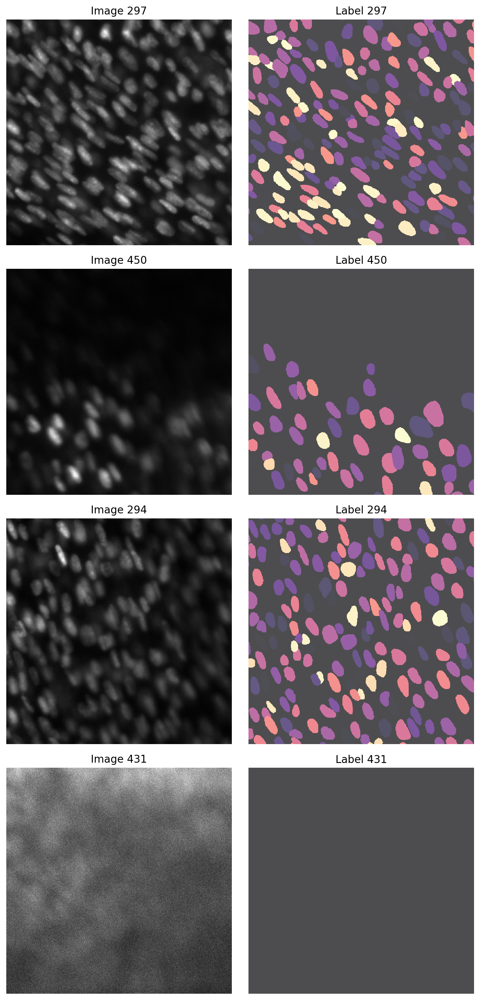

In [16]:
# Ensure num_samples is valid
num_samples = min(4, len(X))  # Prevents errors for small datasets
indices = random.sample(range(len(X)), num_samples)

fig, axes = plt.subplots(num_samples, 2, figsize=(8, num_samples * 4), squeeze=False)

for i, idx in enumerate(indices):
    ax_img, ax_lbl = axes[i, :]

    ax_img.imshow(X[idx], cmap='gray')
    ax_img.set_title(f"Image {idx}")
    ax_img.axis('off')

    ax_lbl.imshow(Y2[idx], cmap='magma', alpha=0.7)  # Different colormap for clarity
    ax_lbl.set_title(f"Label {idx}")  # Distinct title
    ax_lbl.axis('off')

plt.tight_layout()
plt.show()


In [21]:
# Determine number of channels
n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]
print(f"Detected {n_channel} channels in images.")

Detected 1 channels in images.


In [22]:
# Ensure we have enough training data
assert len(X) > 1, "Not enough training data"

### Splitting the dataset for training the model

In [23]:
# Shuffle and split into training/validation sets
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.15 * len(ind))))  # 15% validation split
ind_train, ind_val = ind[:-n_val], ind[-n_val:]

X_val, Y_val = [X[i] for i in ind_val], [Y2[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y2[i] for i in ind_train]

In [24]:
print(f'Number of cropped images: {len(X)}')
print(f'- Training: {len(X_trn)}')
print(f'- Validation: {len(X_val)}')

Number of cropped images: 496
- Training: 422
- Validation: 74


In [25]:
def plot_img_label(img, lbl, img_title="image", lbl_title="label", **kwargs):
    fig, (ai,al) = plt.subplots(1,2, figsize=(12,5), gridspec_kw=dict(width_ratios=(1.25,1)))
    im = ai.imshow(img, cmap='gray', clim=(0,1))
    ai.set_title(img_title)    
    fig.colorbar(im, ax=ai)
    al.imshow(lbl, cmap=lbl_cmap)
    al.set_title(lbl_title)
    plt.tight_layout()

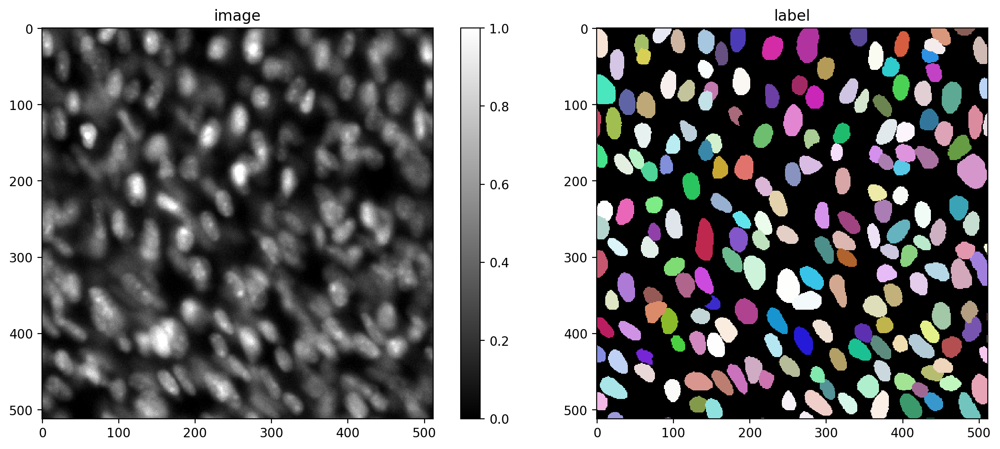

In [26]:
i = min(9, len(X)-1)
img, lbl = X[i], Y2[i]
assert img.ndim in (2,3)
img = img if (img.ndim==2 or img.shape[-1]==3) else img[...,0]
plot_img_label(img,lbl)
None;

## Configuration

In [27]:
# 32 is a good default choice (see 1_data.ipynb)
n_rays = 32

# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = False and gputools_available()

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)
patch_size = (256,256)

conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = use_gpu,
    n_channel_in = n_channel,
    train_patch_size = patch_size,
    train_learning_rate = 1e-4,
)

vars(conf)

{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (2, 2),
 'backbone': 'unet',
 'n_classes': None,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_sample_cache': True,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_class_weights': (1, 1),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0001,


In [24]:
model = StarDist2D(conf, name='stardist_trained_Top30Micron_500epoch_v0', basedir='../models/')

base_model.py (203): output path for model already exists, files may be overwritten: /cephfs/volumes/hpc_data_prj/cmm_stroud/25f618d6-2e01-44f4-94db-6cac7f9ae884/models/stardist_trained_Top30Micron_500epoch_v0
2025-06-23 22:45:29.393905: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2025-06-23 22:45:29.395173: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1886] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38221 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:17:00.0, compute capability: 8.0


Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [25]:
median_size = calculate_extents(list(Y2), np.median)
fov = np.array(model._axes_tile_overlap('YX'))
print(f"median object size:      {median_size}")
print(f"network field of view :  {fov}")
if any(median_size > fov):
    print("WARNING: median object size larger than field of view of the neural network.")

2025-06-23 22:45:36.720896: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8700


median object size:      [30.25 26.  ]
network field of view :  [92 94]


### Data Augmentation

In [17]:
def random_fliprot(img, mask): 
    assert img.ndim >= mask.ndim
    axes = tuple(range(mask.ndim))
    perm = tuple(np.random.permutation(axes))
    img = img.transpose(perm + tuple(range(mask.ndim, img.ndim))) 
    mask = mask.transpose(perm) 
    for ax in axes: 
        if np.random.rand() > 0.5:
            img = np.flip(img, axis=ax)
            mask = np.flip(mask, axis=ax)
    return img, mask 

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,2) + np.random.uniform(-0.2,0.2)
    return img


def augmenter(x, y):
    """Augmentation of a single input/label image pair.
    x is an input image
    y is the corresponding ground-truth label image
    """
    x, y = random_fliprot(x, y)
    x = random_intensity_change(x)
    # add some gaussian noise
    sig = 0.02*np.random.uniform(0,1)
    x = x + sig*np.random.normal(0,1,x.shape)
    return x, y

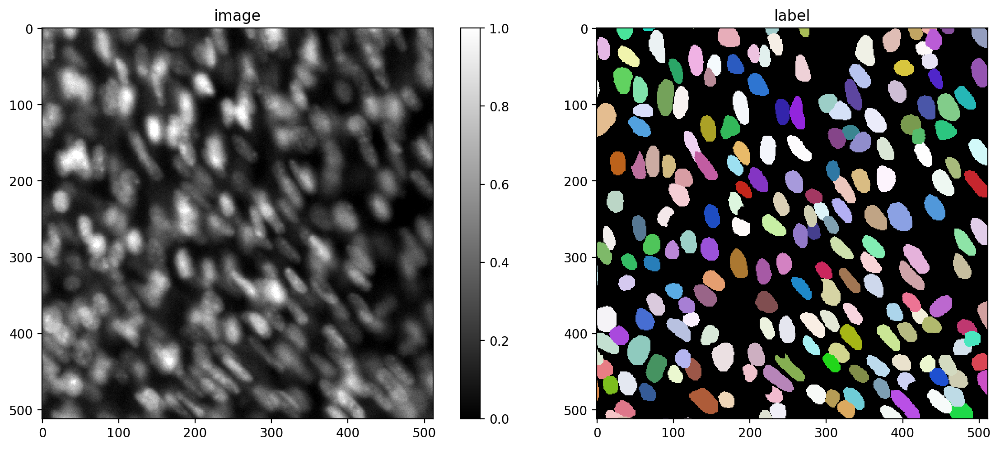

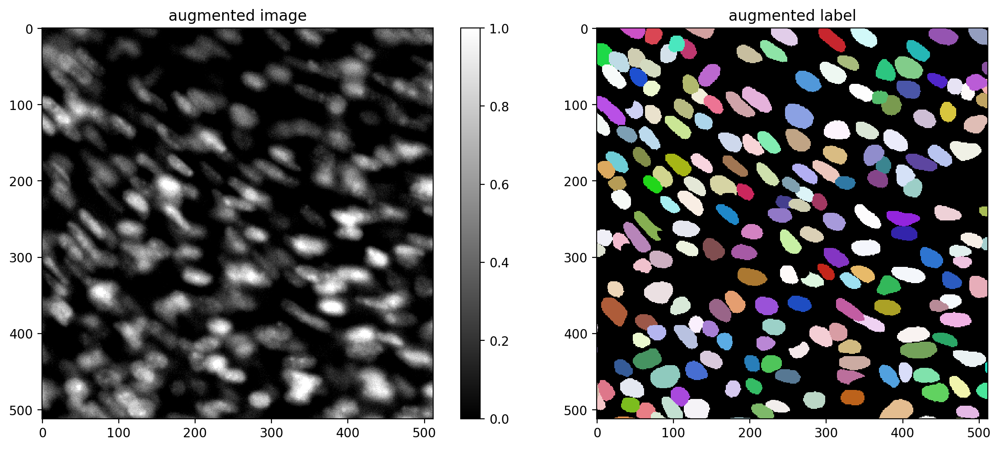

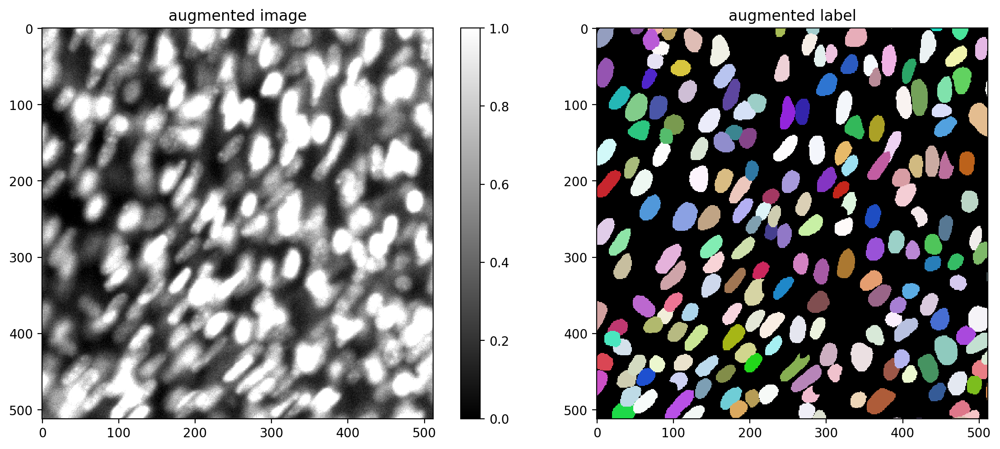

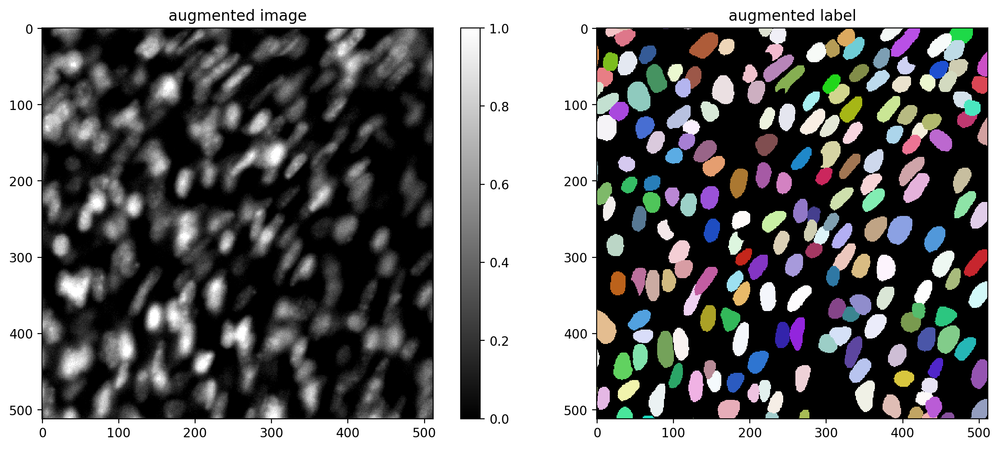

In [29]:
# plot some augmented examples
img, lbl = X[10],Y2[10]
plot_img_label(img, lbl)
for _ in range(3):
    img_aug, lbl_aug = augmenter(img,lbl)
    plot_img_label(img_aug, lbl_aug, img_title="augmented image", lbl_title="augmented label")

In [33]:
quick_demo = False

if quick_demo:
    print (
        "NOTE: This is only for a quick demonstration!\n"
        "      Please set the variable 'quick_demo = False' for proper (long) training.",
        file=sys.stderr, flush=True
    )
    model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter,
                epochs=2, steps_per_epoch=2)

    print("====> Stopping training and loading previously trained demo model from disk.", file=sys.stderr, flush=True)
    model = StarDist2D.from_pretrained('2D_versatile_fluo')
else:
    history = model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter, epochs=500)
None;

Epoch 1/500


2025-06-23 23:23:13.531938: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7e1bfd0a7800 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-06-23 23:23:13.531984: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA A100-SXM4-40GB, Compute Capability 8.0
2025-06-23 23:23:13.537799: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-06-23 23:23:13.616280: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


100/100 [==============================] - 20s 96ms/step - loss: 2.7300 - prob_loss: 0.4351 - dist_loss: 11.4746 - prob_kld: 0.3116 - dist_relevant_mae: 11.4745 - dist_relevant_mse: 195.7561 - dist_dist_iou_metric: 0.0308 - val_loss: 1.9892 - val_prob_loss: 0.3256 - val_dist_loss: 8.3181 - val_prob_kld: 0.1987 - val_dist_relevant_mae: 8.3173 - val_dist_relevant_mse: 124.7247 - val_dist_dist_iou_metric: 0.2477 - lr: 1.0000e-04
Epoch 2/500
100/100 [==============================] - 6s 60ms/step - loss: 1.7337 - prob_loss: 0.3345 - dist_loss: 6.9961 - prob_kld: 0.2116 - dist_relevant_mae: 6.9952 - dist_relevant_mse: 89.4142 - dist_dist_iou_metric: 0.3032 - val_loss: 1.5351 - val_prob_loss: 0.3276 - val_dist_loss: 6.0375 - val_prob_kld: 0.2001 - val_dist_relevant_mae: 6.0365 - val_dist_relevant_mse: 68.4107 - val_dist_dist_iou_metric: 0.3504 - lr: 1.0000e-04
Epoch 3/500
100/100 [==============================] - 4s 43ms/step - loss: 1.4955 - prob_loss: 0.3187 - dist_loss: 5.8841 - prob_kld

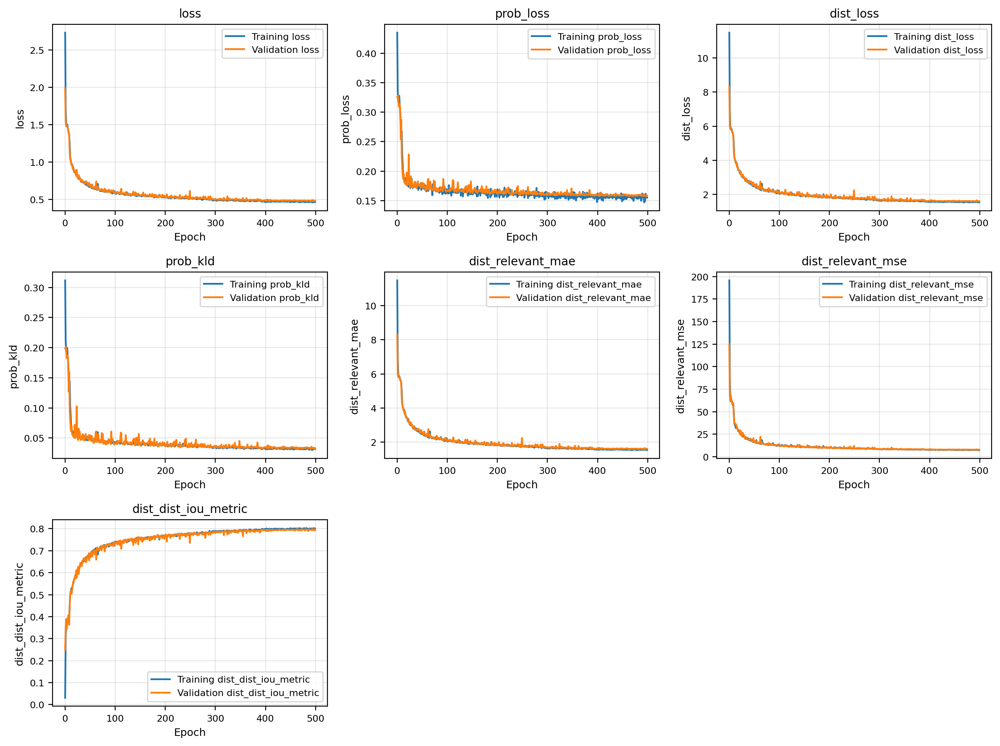

In [34]:
import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history, plots_per_row=3, figsize_per_plot=(4, 3)):
    """
    Plots training and validation metrics from Keras history object
    
    Parameters:
    - history: Keras History object
    - plots_per_row: Number of plots per row (default: 3)
    - figsize_per_plot: Size of each individual plot (width, height) (default: (4, 3))
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Extract metrics from history dictionary
    metrics = [k for k in history.history.keys() if not k.startswith('val_') and k != 'lr']
    n_metrics = len(metrics)
    
    # Calculate grid dimensions
    n_cols = min(plots_per_row, n_metrics)
    n_rows = int(np.ceil(n_metrics / n_cols))
    
    # Calculate figure size based on grid and individual plot size
    fig_width = n_cols * figsize_per_plot[0]
    fig_height = n_rows * figsize_per_plot[1]
    
    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height))
    
    # Handle different cases for axes array
    if n_metrics == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes if n_cols > 1 else [axes]
    else:
        axes = axes.flatten()
    
    # Plot each metric with its validation counterpart
    for i, metric in enumerate(metrics):
        ax = axes[i]
        train_values = history.history[metric]
        val_metric = 'val_' + metric
        
        # Plot training and validation metrics
        ax.plot(train_values, label=f'Training {metric}', linewidth=1.5)
        if val_metric in history.history:
            val_values = history.history[val_metric]
            ax.plot(val_values, label=f'Validation {metric}', linewidth=1.5)
        
        ax.set_title(metric, fontsize=10)
        ax.set_ylabel(metric, fontsize=9)
        ax.set_xlabel('Epoch', fontsize=9)
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.tick_params(labelsize=8)
    
    # Hide unused subplots if any
    for i in range(n_metrics, len(axes)):
        axes[i].set_visible(False)
    
    plt.tight_layout()
    plt.show()
    
plot_training_history(history)

## Threshold optimization

In [35]:
if quick_demo:
    model.optimize_thresholds(X_val[:2], Y_val[:2])
else:
    model.optimize_thresholds(X_val, Y_val)

NMS threshold = 0.5:  75%|███████▌  | 15/20 [00:45<00:15,  3.06s/it, 0.537 -> 0.734]


Using optimized values: prob_thresh=0.466292, nms_thresh=0.3.
Saving to 'thresholds.json'.


## Evaluation

In [36]:
Y_val_pred = [model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)[0]
              for x in tqdm(X_val)]

100%|██████████| 74/74 [00:08<00:00,  9.20it/s]


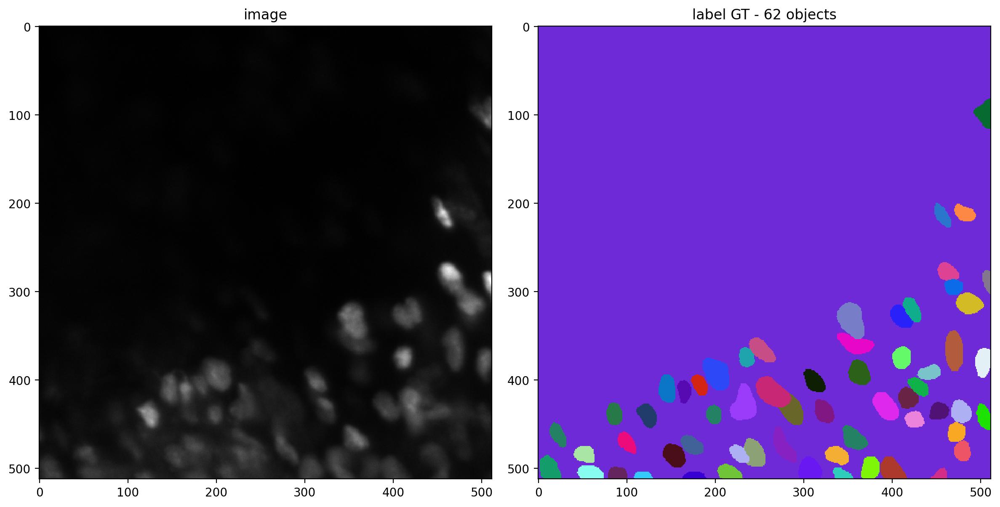

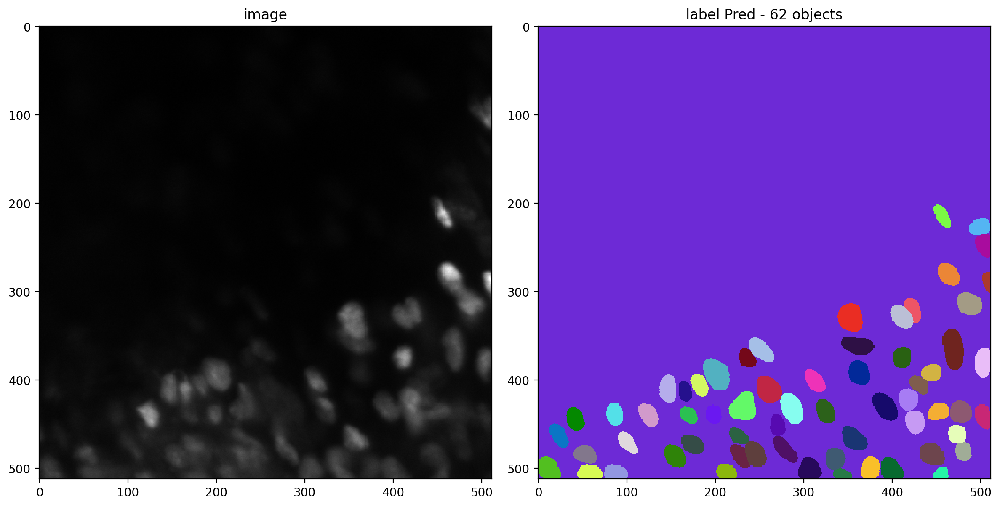

In [37]:
plot_img_label(X_val[0],Y_val[0], lbl_title="label GT")
plot_img_label(X_val[0],Y_val_pred[0], lbl_title="label Pred")

In [38]:
metrics =  matching(Y_val[0], Y_val_pred[0])
print(metrics)

Matching(criterion='iou', thresh=0.5, fp=6, tp=56, fn=6, precision=0.9032258064516129, recall=0.9032258064516129, accuracy=0.8235294117647058, f1=0.9032258064516129, n_true=62, n_pred=62, mean_true_score=0.7551612854003906, mean_matched_score=0.836071423121861, panoptic_quality=0.7551612854003906)


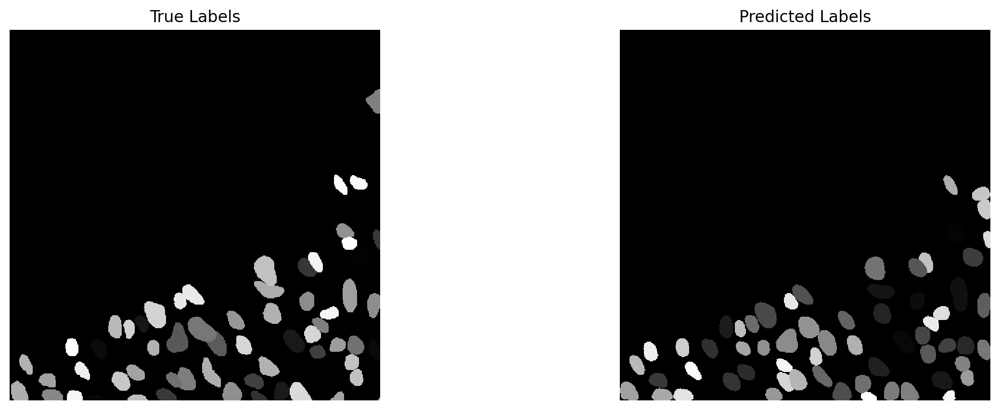

In [39]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Visualize the true labels (ground truth)
ax1.imshow(Y_val[0], cmap='gray')
ax1.set_title('True Labels')
ax1.axis('off')

# Visualize the predicted labels
ax2.imshow(Y_val_pred[0], cmap='gray')
ax2.set_title('Predicted Labels')
ax2.axis('off')

plt.show()

In [40]:
taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats = [matching_dataset(Y_val, Y_val_pred, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [00:07<00:00,  1.23it/s]


In [41]:
stats[taus.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=846, tp=6446, fn=1054, precision=0.8839824465167306, recall=0.8594666666666667, accuracy=0.7723460340282771, f1=0.8715521903731747, n_true=7500, n_pred=7292, mean_true_score=0.7182014074325561, mean_matched_score=0.8356361395817827, panoptic_quality=0.7283005078074867, by_image=False)

In [42]:
stats[taus.index(0.3)]

DatasetMatching(criterion='iou', thresh=0.3, fp=670, tp=6622, fn=878, precision=0.908118486012068, recall=0.8829333333333333, accuracy=0.8105263157894737, f1=0.8953488372093024, n_true=7500, n_pred=7292, mean_true_score=0.7281721479415894, mean_matched_score=0.8247192856481305, panoptic_quality=0.73841145342914, by_image=False)

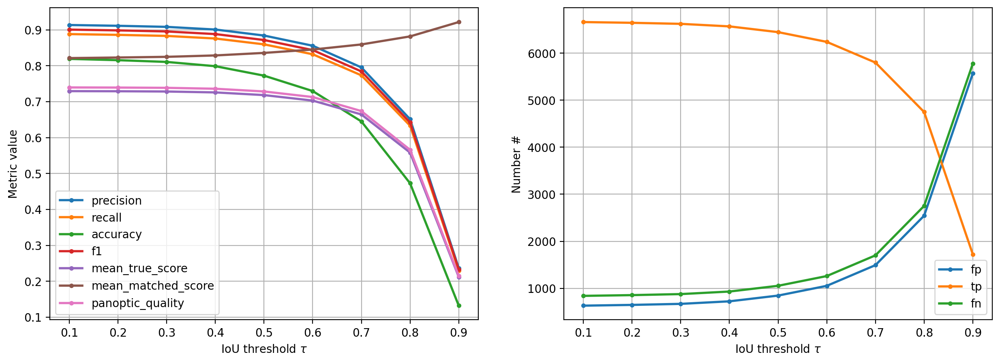

In [43]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))

for m in ('precision', 'recall', 'accuracy', 'f1', 'mean_true_score', 'mean_matched_score', 'panoptic_quality'):
    ax1.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax1.set_xlabel(r'IoU threshold $\tau$')
ax1.set_ylabel('Metric value')
ax1.grid()
ax1.legend()

for m in ('fp', 'tp', 'fn'):
    ax2.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax2.set_xlabel(r'IoU threshold $\tau$')
ax2.set_ylabel('Number #')
ax2.grid()
ax2.legend();

In [44]:
# Laoding the default pre-trained model
model_pretrained = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


In [45]:
# Making predictions using the pre-trained model
my_ls_labels_pt, my_ls_details_pt = model_pretrained.predict_instances(normalize(X_val[0]))

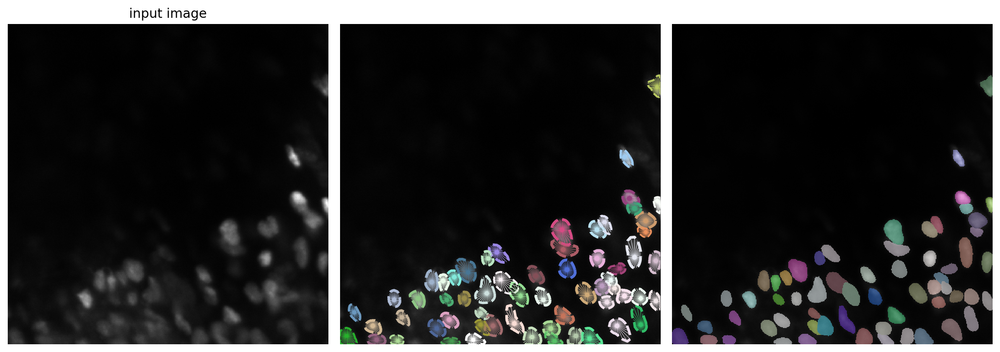

In [46]:
# Visualising the segmentation

from stardist import random_label_cmap, _draw_polygons, export_imagej_rois

import numpy as np
np.random.seed(6)
lbl_cmap = random_label_cmap()

plt.figure(figsize=(13,10))
img_show = X_val[0]
coord, points, prob = my_ls_details_pt['coord'], my_ls_details_pt['points'], my_ls_details_pt['prob']
plt.subplot(131)
plt.imshow(X_val[0], cmap="gray")
plt.axis("off")
plt.title("input image")
plt.subplot(132); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.axis(a)
plt.subplot(133); plt.imshow(img_show, cmap='gray'); plt.axis('off')
plt.imshow(my_ls_labels_pt, cmap=lbl_cmap, alpha=0.5)
plt.tight_layout()
plt.show()

In [47]:
# Comparing the predictions of the custom-trained model and pre-trained model compared to the ground truth

from stardist.matching import matching_dataset
from tqdm import tqdm
import numpy as np

# Function for full evaluation
def evaluate_full(model, X_val, Y_val, thresh=0.5):
    Y_pred = []
    for x in tqdm(X_val, desc=f"Predicting ({model.name})"):
        labels, _ = model.predict_instances(
            normalize(x),  # Match your preprocessing
            n_tiles=model._guess_n_tiles(x),
            show_tile_progress=False
        )
        Y_pred.append(labels)
    return matching_dataset(Y_val, Y_pred, thresh=thresh)

# Evaluate both models on FULL validation set
your_metrics = evaluate_full(model, X_val, Y_val)
pretrained_metrics = evaluate_full(model_pretrained, X_val, Y_val)

print("Your Model (Full Set):\n", your_metrics)
print("\nPretrained Model (Full Set):\n", pretrained_metrics)

Predicting (stardist_trained_Top30Micron_500epoch_v0): 100%|██████████| 74/74 [00:08<00:00,  9.23it/s]
100%|██████████| 74/74 [00:00<00:00, 86.38it/s]

Your Model (Full Set):
 DatasetMatching(criterion='iou', thresh=0.5, fp=848, tp=6452, fn=1048, precision=0.8838356164383562, recall=0.8602666666666666, accuracy=0.7728797316722569, f1=0.8718918918918919, n_true=7500, n_pred=7300, mean_true_score=0.7186581072330475, mean_matched_score=0.8353899262628419, panoptic_quality=0.7283697032767373, by_image=False)

Pretrained Model (Full Set):
 DatasetMatching(criterion='iou', thresh=0.5, fp=2968, tp=6564, fn=936, precision=0.6886277801091062, recall=0.8752, accuracy=0.6270538784868169, f1=0.7707844058243307, n_true=7500, n_pred=9532, mean_true_score=0.7390032267649969, mean_matched_score=0.8443821146766417, panoptic_quality=0.6508365665497271, by_image=False)


### Testing the model on the sample image

In [48]:
# Load a 3D .tif image as a stack of 2D frames
test_image_path = '../Image_Data/old/EHT_Cleared_Hoechst_Deconvolved.tif'
test_img_stack = imread(test_image_path)

# image_stack is a 3D numpy array with shape (z, y, x), where z is the number of frames
# Each slice image_stack[i] is a 2D frame

print(f"Shape of the stack: {test_img_stack.shape}")  # (z, y, x)

Shape of the stack: (400, 2048, 2048)


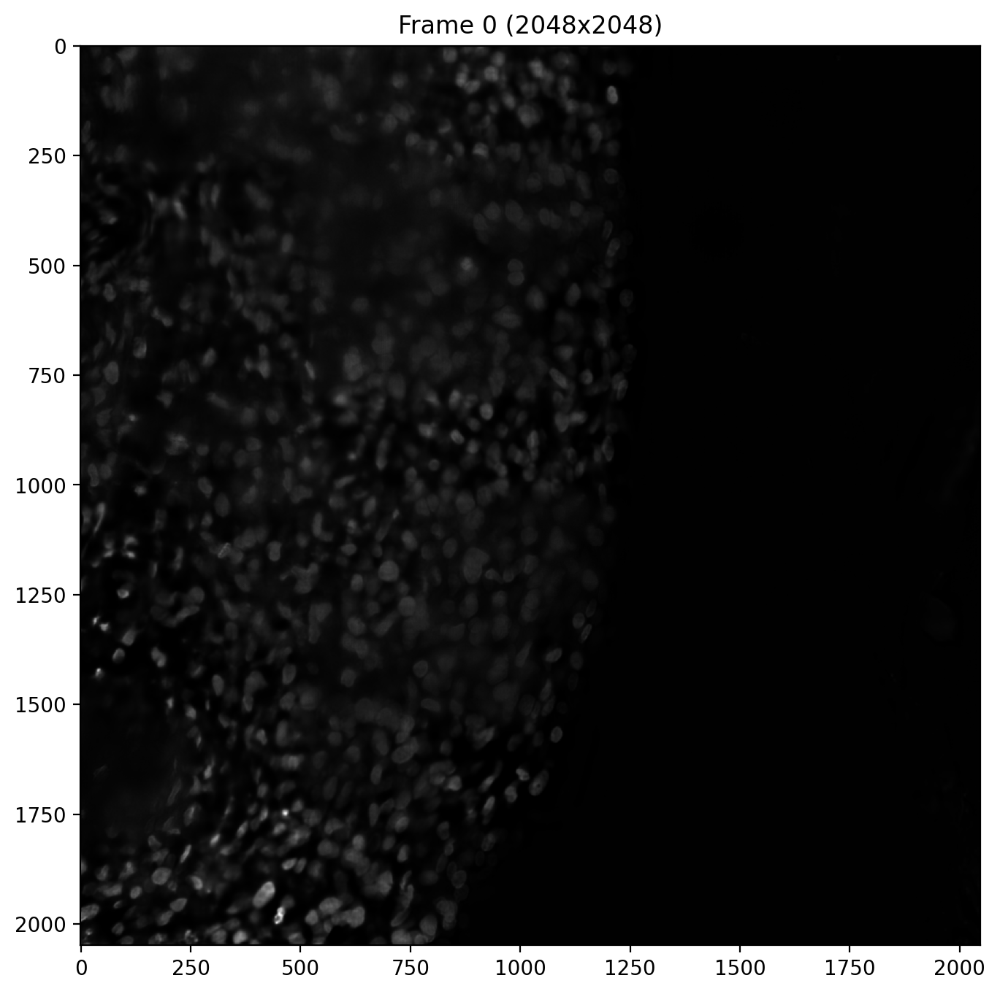

In [49]:
# Display one frame (e.g., the first frame)
plt.figure(figsize=(8, 8))  # Adjust size for better visibility
plt.imshow(test_img_stack[0],cmap='gray')  # Show the first frame
plt.title('Frame 0 (2048x2048)')
plt.show()

Total frames: 400


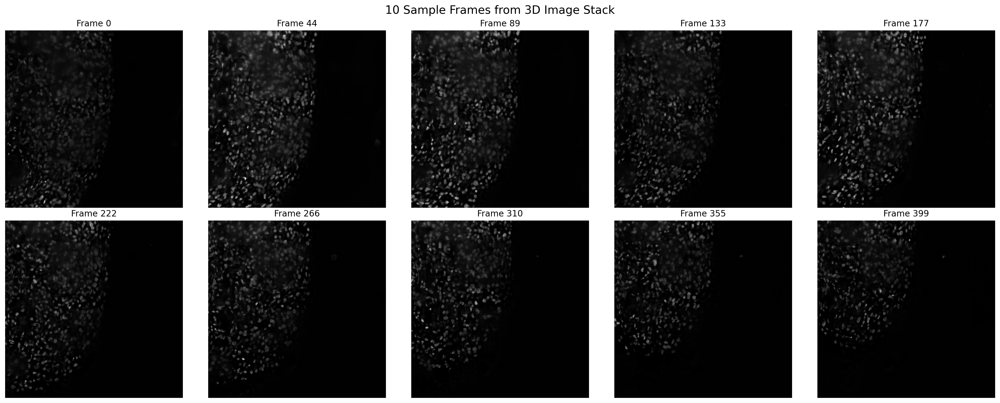

In [50]:
# Number of frames in the stack
num_frames = test_img_stack.shape[0]
print(f"Total frames: {num_frames}")

# Select 10 evenly spaced frames
frames_to_show = 10
frame_indices = [round(i) for i in np.linspace(0, num_frames - 1, frames_to_show)]

# Plot the selected frames
plt.figure(figsize=(20, 8))
for i, frame_idx in enumerate(frame_indices):
    plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns
    plt.imshow(test_img_stack[frame_idx], cmap='gray')
    plt.title(f'Frame {frame_idx}')
    plt.axis('off')

plt.suptitle('10 Sample Frames from 3D Image Stack', fontsize=16)
plt.tight_layout()
plt.show()

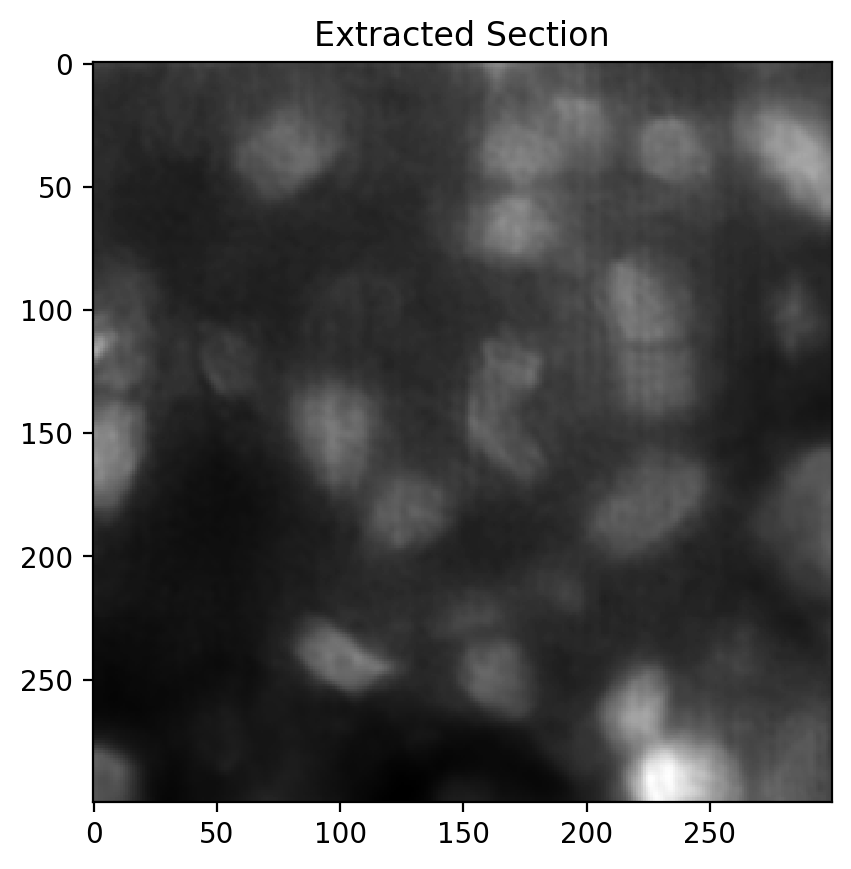

In [51]:
# Extract the section of the frame using slicing
frame = test_img_stack[50]
section = frame[0:300, 250:550]

# Visualize the extracted section
import matplotlib.pyplot as plt
plt.imshow(section, cmap='gray')
plt.title("Extracted Section")
plt.show()

In [58]:
my_fl_labels, my_fl_details = model.predict_instances(normalize(section))

Text(0.5, 1.0, 'prediction + input overlay')

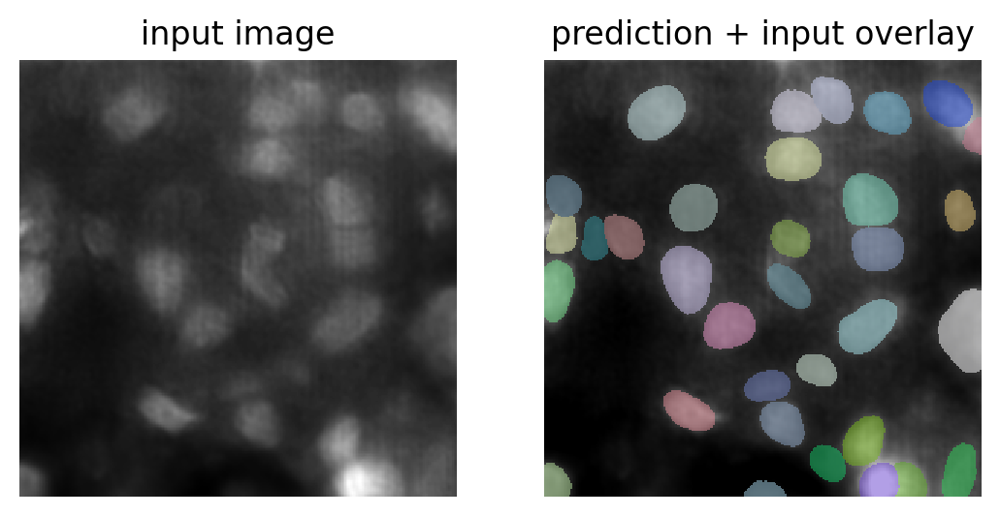

In [59]:
from stardist.plot import render_label

plt.subplot(1,2,1)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("input image")

plt.subplot(1,2,2)
plt.imshow(render_label(my_fl_labels, img=section))
plt.axis("off")
plt.title("prediction + input overlay")

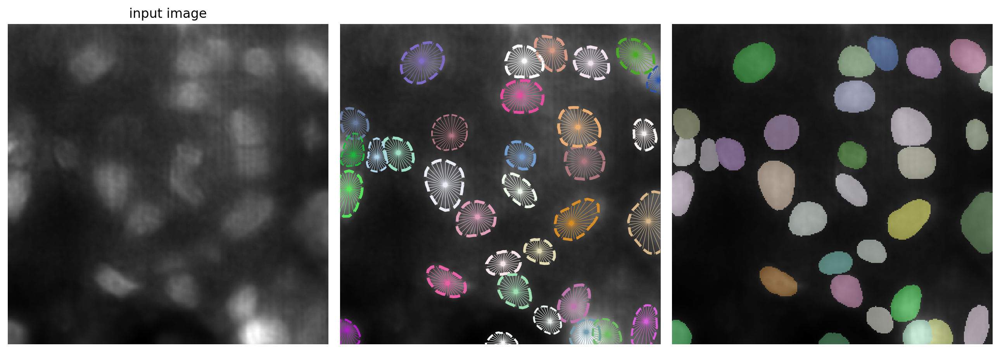

In [60]:
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois

import numpy as np
np.random.seed(6)
lbl_cmap = random_label_cmap()

plt.figure(figsize=(13,10))
img_show = section
coord, points, prob = my_fl_details['coord'], my_fl_details['points'], my_fl_details['prob']
plt.subplot(131)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("input image")
plt.subplot(132); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.axis(a)
plt.subplot(133); plt.imshow(img_show, cmap='gray'); plt.axis('off')
plt.imshow(my_fl_labels, cmap=lbl_cmap, alpha=0.5)
plt.tight_layout()
plt.show()

## Comparing the model trained on our dataset with the pre-trained model

In [61]:
model_pretrained = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


In [62]:
my_fl_labels_pt, my_fl_details_pt = model_pretrained.predict_instances(normalize(section), prob_thresh=0.4)

Text(0.5, 1.0, 'prediction + input overlay')

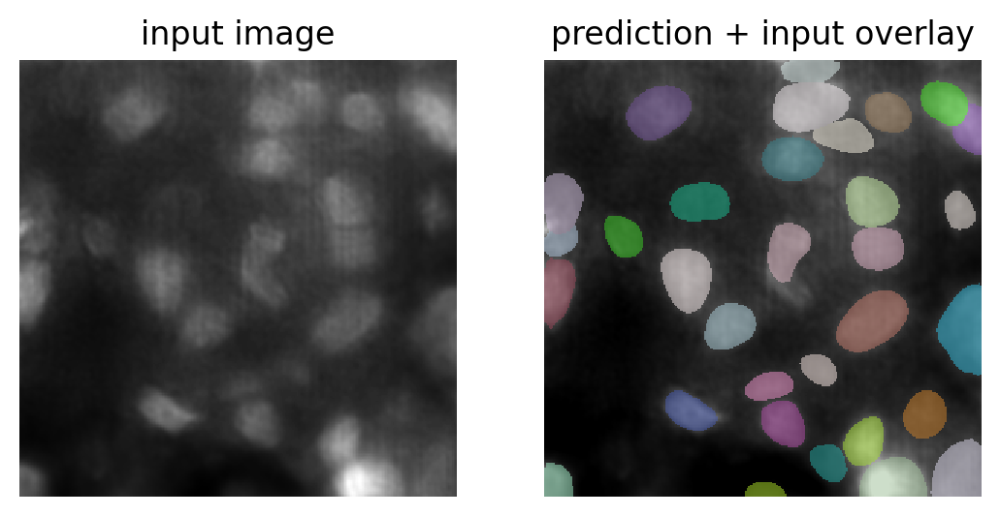

In [63]:
from stardist.plot import render_label

plt.subplot(1,2,1)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("input image")

plt.subplot(1,2,2)
plt.imshow(render_label(my_fl_labels_pt, img=section))
plt.axis("off")
plt.title("prediction + input overlay")

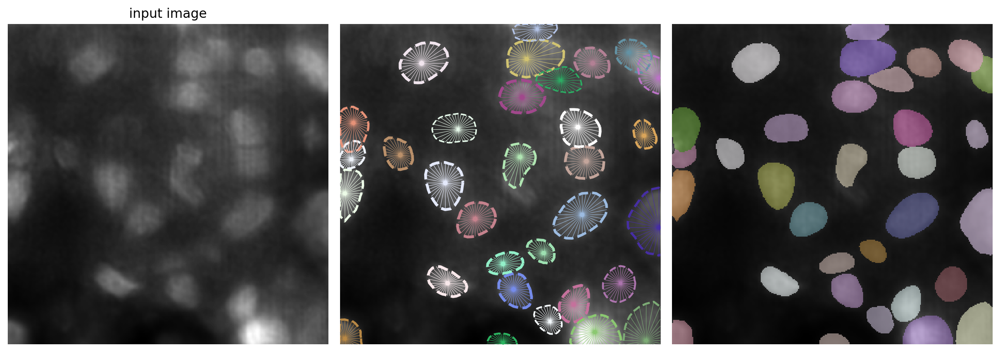

In [64]:
np.random.seed(6)
lbl_cmap = random_label_cmap()

plt.figure(figsize=(13,10))
img_show = section
coord, points, prob = my_fl_details_pt['coord'], my_fl_details_pt['points'], my_fl_details_pt['prob']
plt.subplot(131)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("input image")
plt.subplot(132); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.axis(a)
plt.subplot(133); plt.imshow(img_show, cmap='gray'); plt.axis('off')
plt.imshow(my_fl_labels_pt, cmap=lbl_cmap, alpha=0.5)
plt.tight_layout()
plt.show()

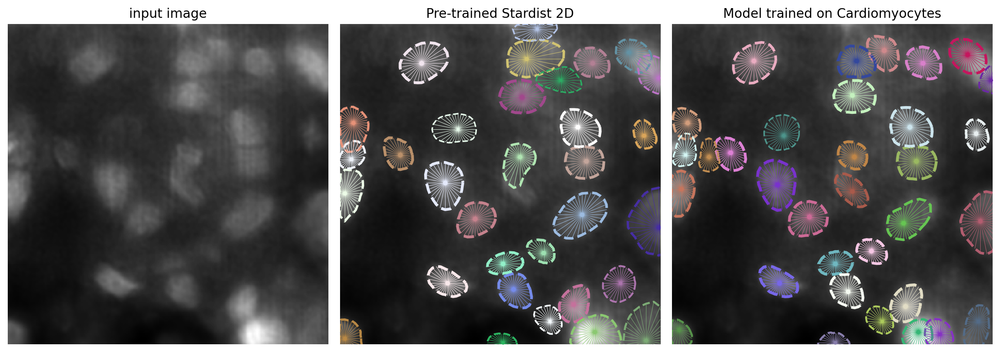

In [65]:
np.random.seed(6)
lbl_cmap = random_label_cmap()

plt.figure(figsize=(13,10))
img_show = section
coord, points, prob = my_fl_details['coord'], my_fl_details['points'], my_fl_details['prob']
coord_pt, points_pt, prob_pt = my_fl_details_pt['coord'], my_fl_details_pt['points'], my_fl_details_pt['prob']
plt.subplot(131)
plt.imshow(section, cmap="gray")
plt.axis("off")
plt.title("input image")
plt.subplot(132); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord_pt, points_pt, prob_pt, show_dist=True)
plt.title("Pre-trained Stardist 2D")
plt.axis(a)
plt.subplot(133); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.title("Model trained on Cardiomyocytes")
plt.axis(a)
plt.tight_layout()
plt.show()

# Testing on Annotated image

In [9]:
# Load full multi-frame images and labels. Test image is a small section extracted from LA region of embryonic mouse heart
image_path = '../Image_Data/old/test_img.tif'
label_path =  '../Image_Data/old/test_label.tif' 

image_stack = imread(image_path)  # Shape: (31, 2048, 2048)
label_stack = imread(label_path)
label_stack = np.round(label_stack).astype(int)

In [10]:
print(f"Shape of the image stack: {image_stack.shape}")  # (z, y, x)
print(f"Shape of the label stack: {label_stack.shape}")  # (z, y, x)

print(f"image dtype: {image_stack.dtype}") 
print(f"label_stack dtype: {label_stack.dtype}")

Shape of the image stack: (510, 504)
Shape of the label stack: (510, 504)
image dtype: uint16
label_stack dtype: int64


In [12]:
# Loading the trained model for assessment

from stardist.models import StarDist2D  # For 2D model

# Load with directory structure used during training
model = StarDist2D(None, name='stardist_trained_Top30Micron_500epoch_v0', basedir='../models/')

2025-07-13 10:01:12.754594: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2025-07-13 10:01:12.754839: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1886] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30983 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:3b:00.0, compute capability: 7.0


Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.466292, nms_thresh=0.3.


In [13]:
model_pretrained = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


In [16]:
image_norm = normalize(image_stack)
labels_pt, details_pt = model_pretrained.predict_instances(image_norm, prob_thresh=0.4)

2025-07-13 10:05:54.997487: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8700


In [17]:
labels_custom, details_custom = model.predict_instances(image_norm)

In [20]:
from stardist.matching import matching

results_custom = matching(label_stack, labels_custom)
results_custom

Matching(criterion='iou', thresh=0.5, fp=23, tp=111, fn=17, precision=0.8283582089552238, recall=0.8671875, accuracy=0.7350993377483444, f1=0.8473282442748091, n_true=128, n_pred=134, mean_true_score=0.7313050031661987, mean_matched_score=0.8433066703177787, panoptic_quality=0.7145575603455988)

In [21]:
results_pt = matching(label_stack, labels_pt)
results_pt

Matching(criterion='iou', thresh=0.5, fp=3, tp=127, fn=1, precision=0.9769230769230769, recall=0.9921875, accuracy=0.9694656488549618, f1=0.9844961240310077, n_true=128, n_pred=130, mean_true_score=0.9769349098205566, mean_matched_score=0.9846273106852854, panoptic_quality=0.9693617709847384)

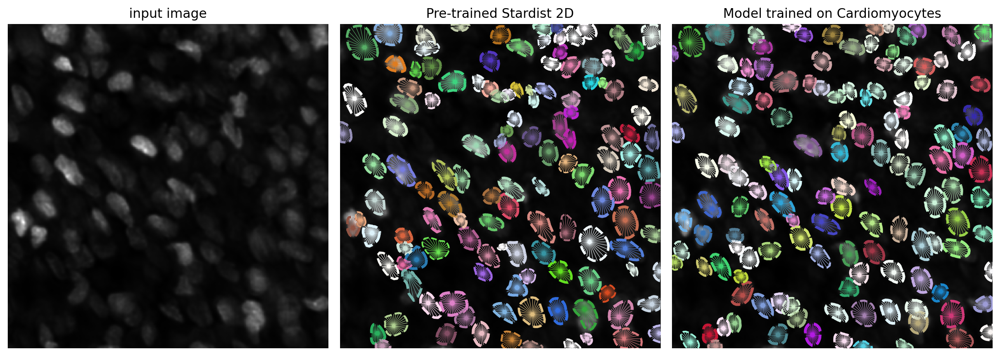

In [24]:
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois

np.random.seed(6)
lbl_cmap = random_label_cmap()

plt.figure(figsize=(13,10))
img_show = image_stack
coord, points, prob = details_custom['coord'], details_custom['points'], details_custom['prob']
coord_pt, points_pt, prob_pt = details_pt['coord'], details_pt['points'], details_pt['prob']
plt.subplot(131)
plt.imshow(image_stack, cmap="gray")
plt.axis("off")
plt.title("input image")
plt.subplot(132); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord_pt, points_pt, prob_pt, show_dist=True)
plt.title("Pre-trained Stardist 2D")
plt.axis(a)
plt.subplot(133); plt.imshow(img_show, cmap='gray'); plt.axis('off')
a = plt.axis()
_draw_polygons(coord, points, prob, show_dist=True)
plt.title("Model trained on Cardiomyocytes")
plt.axis(a)
plt.tight_layout()
plt.show()